### Importing Libraries

In [ ]:
import pandas as pd 
import re 
import os
import numpy as np
import matplotlib.pyplot as plt
from datetime import datetime
import spacy
import seaborn as sns
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score 
from bertopic import BERTopic
from sentence_transformers import SentenceTransformer 
from sklearn.metrics.pairwise import cosine_similarity 

from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.metrics import confusion_matrix, classification_report
from imblearn.over_sampling import SMOTE
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import umap 

nlp = spacy.load("en_core_web_sm")

In [ ]:
def load_tweets_with_metadata(filepath, channel):
    data = []
    with open(filepath, "r", encoding="ISO-8859-1") as file:  # updated encoding
        for line in file:
            parts = line.strip().split("|")
            if len(parts) == 3:
                tweet_id = parts[0]
                timestamp = parts[1]
                raw_headline = parts[2]

                # Parse timestamp
                try:
                    dt = datetime.strptime(timestamp, "%a %b %d %H:%M:%S %z %Y")
                    date = dt.date().isoformat()
                    time = dt.time().strftime("%H:%M:%S")
                except ValueError:
                    date = ""
                    time = ""

                # Clean headline
                headline = re.sub(r"http\S+", "", raw_headline)
                headline = re.sub(r"\b(VIDEO|AUDIO):", "", headline, flags=re.IGNORECASE)
                headline = re.sub(r"[@#]\S+", "", headline)
                headline = re.sub(r"[\"\'\-\/?]", " ", headline)
                headline = re.sub(r"\s+", " ", headline).strip()

                data.append({
                    "tweet_id": tweet_id,
                    "date": date,
                    "time": time,
                    "headline": headline,
                    "channel": channel
                })
    return pd.DataFrame(data)

###Training data 
cnn_df = load_tweets_with_metadata("cnnhealth.txt", "CNN")
fox_df = load_tweets_with_metadata("foxnewshealth.txt", "fox")
nbc_df = load_tweets_with_metadata("NBChealth.txt", "NBC")
bbc_df = load_tweets_with_metadata("bbchealth.txt", "BBC")
cbc_df = load_tweets_with_metadata("cbchealth.txt", "cbc")
reuters_df = load_tweets_with_metadata("reuters_health.txt", "reuters")
gdnhealth_df = load_tweets_with_metadata("gdnhealthcare.txt", "gdnhealth")
goodhealth_df = load_tweets_with_metadata("goodhealth.txt", "goodhealth")
Kaiser_df = load_tweets_with_metadata("KaiserHealthNews.txt", "Kaiser")
latimes_df = load_tweets_with_metadata("latimeshealth.txt", "Kaiser")
nprhealth_df = load_tweets_with_metadata("nprhealth.txt", "Kaiser")
nytimes = load_tweets_with_metadata("nytimeshealth.txt", "nytimes")
msn_df = load_tweets_with_metadata("msnhealthnews.txt", "msn")

### Testing data




### Training data 

##### Dataframe of tweets from 13 channels 

In [4]:
df = pd.concat([cnn_df, fox_df, nbc_df, bbc_df,cbc_df,reuters_df,nytimes, msn_df,Kaiser_df,goodhealth_df,
                latimes_df,nprhealth_df,gdnhealth_df], ignore_index=True)

In [ ]:
lines = df['headline'].dropna().astype(str).tolist()


# Load Sentence-BERT model
embedder = SentenceTransformer("all-MiniLM-L6-v2")

# Create and fit BERTopic
topic_model = BERTopic(embedding_model=embedder)
topics, probs = topic_model.fit_transform(lines)


In [36]:
df.describe()

,topic,topic_probability
count,55273.000000,55273.000000
mean,134.196515,0.507322
std,199.533689,0.430711
min,-1.000000,0.000000
25%,-1.000000,0.000000
50%,30.000000,0.570924
75%,196.000000,1.000000
max,826.000000,1.000000


In [ ]:
topic_model.save("bertopic_model_wednesday")

2025-04-18 10:36:05,185 - BERTopic - WARNING: When you use `pickle` to save/load a BERTopic model,please make sure that the environments in which you saveand load the model are **exactly** the same. The version of BERTopic,its dependencies, and python need to remain the same.
c:\Users\wisen\Documents\Python Scripts\.venv\Lib\site-packages\scipy\sparse\_index.py:143: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.



In [6]:

# Show summary of topics
topic_info = topic_model.get_topic_info()
print(topic_info.head(20))

    Topic  Count                                     Name  \
0      -1  19674              -1_insurance_health_rt_care   
1       0    416     0_pharmacies_drugs_drug_prescription   
2       1    411  1_concussions_concussion_players_injury   
3       2    375        2_cancer_chemo_living_connecticut   
4       3    369            3_nhs_labour_election_forward   
5       4    342               4_soda_sugar_sugary_drinks   
6       5    337         5_marijuana_pot_cannabis_medical   
7       6    307            6_doctor_doctors_medical_docs   
8       7    288      7_cigarettes_cigarette_tobacco_cigs   
9       8    285       8_liberia_liberian_ebola_liberians   
10      9    284    9_alzheimer_dementia_alzheimerâ_early   
11     10    263                           10_q4_q2_q3_q7   
12     11    259          11_alcohol_drinking_binge_drink   
13     12    248                 12_eye_blind_vision_eyes   
14     13    247              13_cold_winter_weather_heat   
15     14    246        

In [17]:
topic_info.to_csv("topic_info_head2.csv", index=False)

In [32]:
topic_model.visualize_barchart(top_n_topics = 10, n_words = 20)

In [33]:

#### Getting the bottom topics 
frequencies = topic_model.get_topic_info()
frequencies = frequencies[frequencies.Topic != -1]
bottom_topics = frequencies.sort_values("Count").head(10).Topic.tolist()
topic_model.visualize_barchart(topics=bottom_topics, n_words=10)

#### Most Common Words used in the tweets 

In [9]:
from collections import Counter
from nltk.corpus import stopwords
import nltk

all_words = ' '.join(df['headline']).lower().split()

# Prepare stopwords and remove 'rt' manually
stop_words = set(stopwords.words('english'))
stop_words.add('rt')  # explicitly ignore 'rt'

# Filter non-alphabetic tokens and stopwords
filtered_words = [word for word in all_words if word.isalpha() and word not in stop_words]

# Count word frequencies
word_counts = Counter(filtered_words)
common_words_df = pd.DataFrame(word_counts.most_common(20), columns=["Word", "Frequency"])

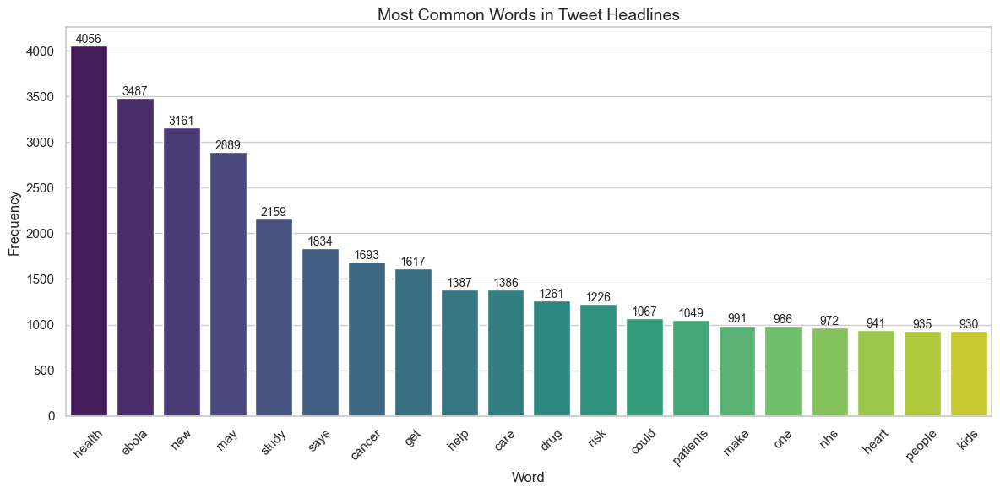

In [10]:
# Plot using seaborn
plt.figure(figsize=(12, 6))
sns.set(style="whitegrid")
barplot = sns.barplot(x='Word', y='Frequency', data=common_words_df, palette='viridis')

# Add frequency labels on top of bars
for i, row in common_words_df.iterrows():
    barplot.text(i, row.Frequency + 0.2, row.Frequency, ha='center', va='bottom', fontsize=10)

plt.title("Most Common Words in Tweet Headlines", fontsize=14)
plt.xlabel("Word", fontsize=12)
plt.ylabel("Frequency", fontsize=12)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

It is noticeable that ebola is the second most common word used by the health related news channel tweets

## Remove Stop Words , like the , I 

In [ ]:
top_channels = df['channel'].value_counts().nlargest(10).index
df_top = df[df['channel'].isin(top_channels)]

#Prepare stopwords
stop_words = set(stopwords.words('english'))
stop_words.add('rt')

# Extract top 3 words per channel
top_words_per_channel = []

for channel, group in df_top.groupby('channel'):
    words = ' '.join(group['headline']).lower().split()
    filtered = [word for word in words if word.isalpha() and word not in stop_words]
    top_words = Counter(filtered).most_common(3)
    for word, freq in top_words:
        top_words_per_channel.append({'Channel': channel, 'Word': word, 'Frequency': freq})

# Create DataFrame and plot
top_words_df = pd.DataFrame(top_words_per_channel)

In [ ]:
top_words_df.to_csv("channelmostwords.csv", index=False) #### Not necessary but you can save it here 

### Barchart showing the most frequently used words per 13 Channels

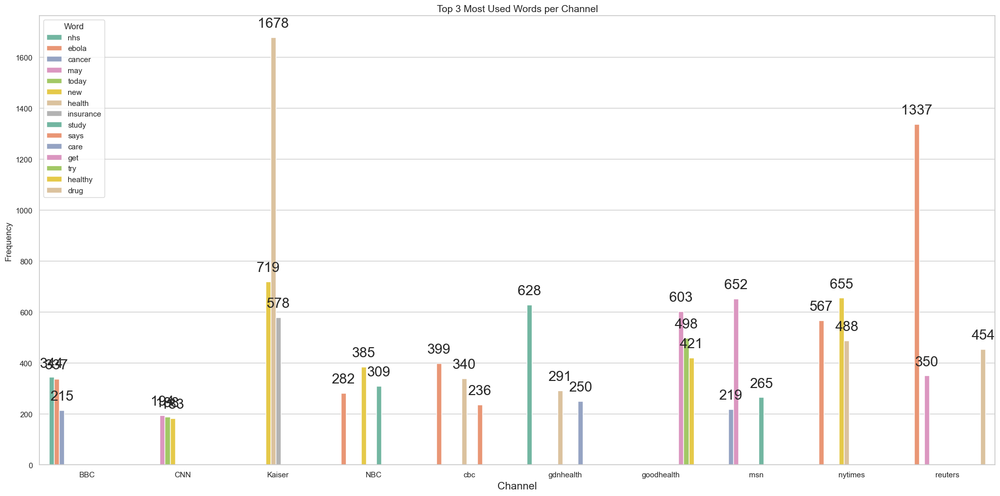

In [ ]:

plt.figure(figsize=(20, 10))
sns.set(style="whitegrid")

barplot = sns.barplot(data=top_words_df, x='Channel', y='Frequency', hue='Word', dodge=True, palette='Set2')

for container in barplot.containers:
    barplot.bar_label(container, fmt='%.0f', label_type='edge', padding=10, fontsize=20)

plt.title("Top 3 Most Used Words per Channel", fontsize=14)
plt.xlabel("Channel", fontsize=15)
plt.ylabel("Frequency", fontsize=12)
plt.xticks(rotation=0,ha='center', fontsize=11)
plt.legend(title='Word')
plt.tight_layout()
plt.show()

### Monthly Tweet Volume by Channel

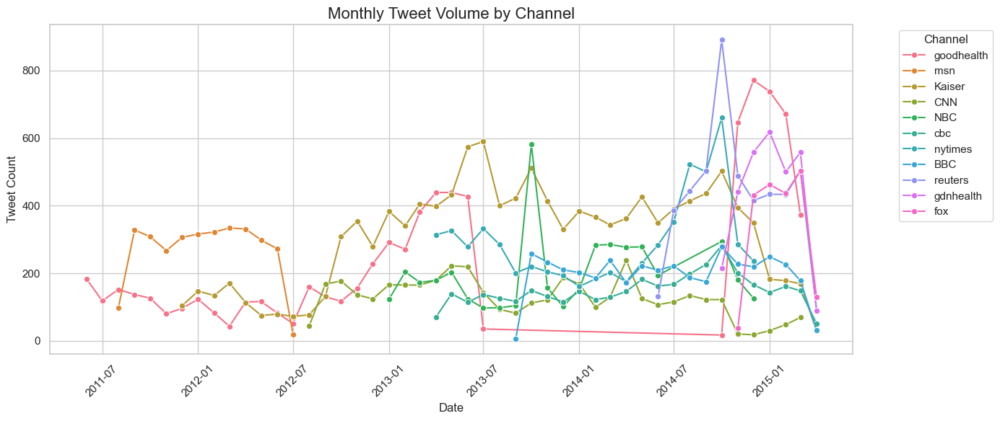

In [ ]:
# Ensure 'date' is in datetime format
df['date'] = pd.to_datetime(df['date'])

# Group by month and channel, count tweets
monthly_volume = (
    df.groupby([df['date'].dt.to_period('M'), 'channel'])
      .size()
      .reset_index(name='Tweet_Count')
)

monthly_volume['date'] = monthly_volume['date'].dt.to_timestamp()

plt.figure(figsize=(14, 6))
sns.lineplot(data=monthly_volume, x='date', y='Tweet_Count', hue='channel', marker='o')
plt.title("Monthly Tweet Volume by Channel", fontsize=16)
plt.xlabel("Date")
plt.ylabel("Tweet Count")
plt.legend(title="Channel", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

### Monthly Ebola Related Tweets by Channel

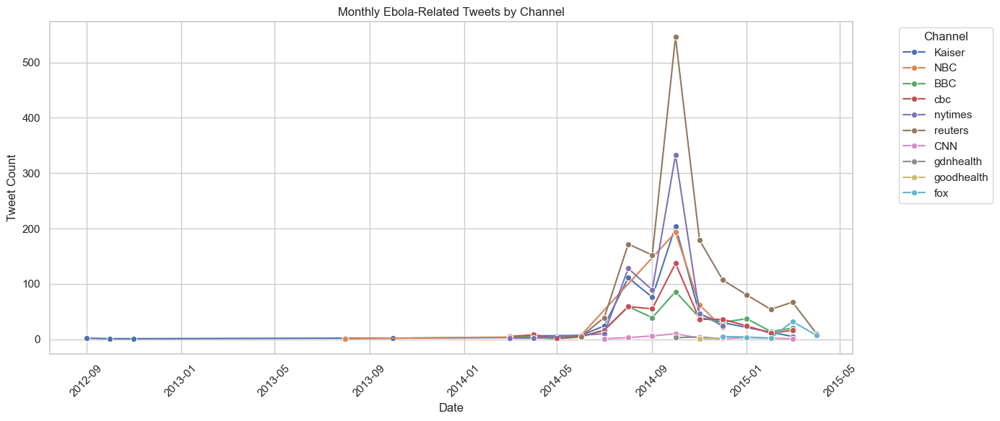

In [ ]:


df['date'] = pd.to_datetime(df['date'])

# Filter for Ebola-related tweets
ebola_df = df[df['headline'].str.contains('ebola', case=False, na=False)]

# Group by month and channel, count tweets
ebola_monthly = (
    ebola_df
    .groupby([ebola_df['date'].dt.to_period('M'), 'channel'])
    .size()
    .reset_index(name='Ebola_Tweet_Count')
)

# Convert period to timestamp for plotting
ebola_monthly['date'] = ebola_monthly['date'].dt.to_timestamp()

plt.figure(figsize=(14, 6))
sns.lineplot(data=ebola_monthly, x='date', y='Ebola_Tweet_Count', hue='channel', marker='o')
plt.title("Monthly Ebola-Related Tweets by Channel")
plt.xlabel("Date")
plt.ylabel("Tweet Count")
plt.xticks(rotation=45)
plt.legend(title='Channel', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

We notice that there are more tweets in the period of May 2014 - May 2015. Hence we investigate to find out which Channels tweeted the most about Ebola in this period

### Ebola tweets between May 2014 and May 2016 . 

The reason for this plot was because of the high influx of tweets within this period 

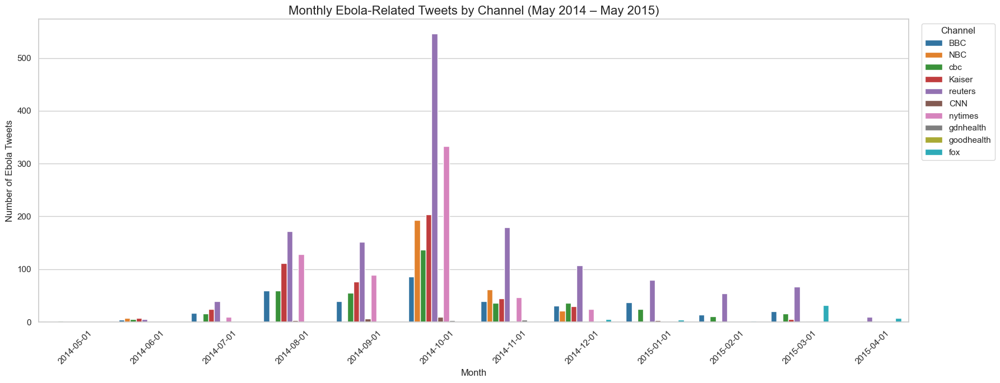

In [ ]:
# Filter for the desired time window
mask = (ebola_df['date'] >= '2014-05-01') & (ebola_df['date'] <= '2015-05-31')
ebola_filtered = ebola_df.loc[mask]

# Group by month and channel
ebola_monthly = (
    ebola_filtered
    .groupby([ebola_filtered['date'].dt.to_period('M'), 'channel'])
    .size()
    .reset_index(name='Ebola_Tweet_Count')
)
ebola_monthly['date'] = ebola_monthly['date'].dt.to_timestamp()

# Plot
plt.figure(figsize=(18, 7))
sns.set(style="whitegrid")

barplot = sns.barplot(
    data=ebola_monthly,
    x='date',
    y='Ebola_Tweet_Count',
    hue='channel',
    palette='tab10'
)

plt.title("Monthly Ebola-Related Tweets by Channel (May 2014 – May 2015)", fontsize=16)
plt.xlabel("Month", fontsize=12)
plt.ylabel("Number of Ebola Tweets", fontsize=12)
plt.xticks(rotation=45)
plt.legend(title='Channel', bbox_to_anchor=(1.01, 1), loc='upper left')
plt.tight_layout()
plt.show()


As seen reuters had more tweets about Ebola in October 2014 , compared to the rest of the channels , goodhealth twitter channel had the least tweets about ebola compared to all other channels. This shows that the channel was not focused on Ebola

In [ ]:
# Assign topics to headlines
##df = pd.DataFrame({"headline": lines, "topic": topics})

df['topic'] = topics
df['topic_probability'] = probs

In [ ]:
#dictionary mapping topic ID → 4 keyword label
topic_labels = {}
for topic_num in set(df['topic']):
    if topic_num != -1: ## This helps to skip outliers 
        keywords = topic_model.get_topic(topic_num)
        top_words = [word for word, _ in keywords[:4]]
        label = "_".join(top_words)
        topic_labels[topic_num] = label
    else:
        topic_labels[-1] = "outlier"  # label for unclassified docs if needed

# new column with readable topic names
df['topic_label'] = df['topic'].map(topic_labels)

In [ ]:
df.head()

,tweet_id,date,time,headline,channel,topic,topic_probability,topic_label
0,576880531301801984,2015-03-14,23:00:11,An abundance of online info can turn us into e...,CNN,-1,0.000000,outlier
1,576820122666471424,2015-03-14,19:00:08,A plant based diet that incorporates fish may ...,CNN,-1,0.000000,outlier
2,576744652717461504,2015-03-14,14:00:15,It doesn t take much to damage your hearing at...,CNN,56,1.000000,hearing_ear_deaf_ears
3,576736754436304896,2015-03-14,13:28:52,RT Forever young Discover this islandâs secr...,CNN,45,0.445152,longer_expectancy_longevity_lifespans
4,576736614766010368,2015-03-14,13:28:18,RT Is post traumatic stress disorder in your g...,CNN,-1,0.000000,outlier


In [ ]:
### Number of Topics in a column 
print(df['topic'].value_counts())

topic
-1      19674
 0        416
 1        411
 2        375
 3        369
        ...  
 824       10
 825       10
 826       10
 827       10
 828       10
Name: count, Length: 830, dtype: int64


In [ ]:
df.describe()

,date,topic,topic_probability
count,55273,55273.000000,55273.000000
mean,2014-01-11 00:27:38.502342912,134.854667,0.496969
min,2011-06-13 00:00:00,-1.000000,0.000000
25%,2013-05-17 00:00:00,-1.000000,0.000000
50%,2014-04-01 00:00:00,31.000000,0.537405
75%,2014-11-10 00:00:00,196.000000,1.000000
max,2015-04-09 00:00:00,828.000000,1.000000
std,NaN,200.292606,0.430249


### Using Interstopic Distance Mapping

In [ ]:
topic_model.visualize_topics()

#### Use Cosine Similarity to Merge Clusters that are close to each other

In [ ]:

distance_matrix = cosine_similarity(np.array(topic_model.topic_embeddings_))
dist_df = pd.DataFrame(distance_matrix, columns=topic_model.topic_labels_.values(), 
                       index=topic_model.topic_labels_.values())

tmp = []
for rec in dist_df.reset_index().to_dict('records'):
    t1 = rec['index']
    for t2 in rec:
        if t2 == 'index': 
            continue
        tmp.append(
            {
                'topic1': t1, 
                'topic2': t2, 
                'distance': rec[t2]
            }
        )

pair_dist_df = pd.DataFrame(tmp)

pair_dist_df = pair_dist_df[(pair_dist_df.topic1.map(
      lambda x: not x.startswith('-1'))) & 
            (pair_dist_df.topic2.map(lambda x: not x.startswith('-1')))]
pair_dist_df = pair_dist_df[pair_dist_df.topic1 < pair_dist_df.topic2]
pair_dist_df.sort_values('distance', ascending = False).head(30)

,topic1,topic2,distance
104792,125_hospitals_minimising_staff_workers,211_atlanta_american_arrives_worker,0.932052
176000,211_atlanta_american_arrives_worker,39_negative_tests_uk_tested,0.914018
171197,205_toll_rises_death_296,216_toll_west_africa_congo,0.912979
104601,125_hospitals_minimising_staff_workers,20_ebola_outbreak_crisis_facts,0.912005
17474,20_ebola_outbreak_crisis_facts,43_africa_west_african_africans,0.907099
256228,307_quarantine_quarantines_returning_quarantined,587_jersey_quarantine_york_travelers,0.906352
104620,125_hospitals_minimising_staff_workers,39_negative_tests_uk_tested,0.906052
17794,20_ebola_outbreak_crisis_facts,363_briefing_watch_live_holds,0.905333
214174,257_sierra_leone_dies_doctor,33_leone_sierra_lockdown_declares,0.899794
104888,125_hospitals_minimising_staff_workers,307_quarantine_quarantines_returning_quarantined,0.897676


In [ ]:
df.to_csv("C:/Users/Wisen/Documents/final_topic_output_Friday2.csv", index=False)

### Reducing Outliers 

In [ ]:
new_topics = topic_model.reduce_outliers(lines, topics, strategy="c-tf-idf")
#new_topics = topic_model.reduce_outliers(docs, topics, strategy="embeddings")
#new_topics = topic_model.reduce_outliers(lines, topics, strategy="distributions")

In [ ]:
df['reassigned_topic'] = new_topics

In [ ]:
topic_labels = {}
for topic_num in set(df['reassigned_topic']):
    if topic_num != -1:  # optionally skip outliers
        keywords = topic_model.get_topic(topic_num)
        top_words = [word for word, _ in keywords[:4]]
        label = "_".join(top_words)
        topic_labels[topic_num] = label
    else:
        topic_labels[-1] = "outlier"  # label for unclassified docs if needed

# Create a new column with readable topic names
df['reassigned_topic_label'] = df['reassigned_topic'].map(topic_labels)

In [ ]:
df.head()

,tweet_id,date,time,headline,channel,topic,topic_probability,topic_label,reassigned_topic,reassigned_topic_label
0,576880531301801984,2015-03-14,23:00:11,An abundance of online info can turn us into e...,CNN,130,0.388561,skype_apps_mobile_text,130,skype_apps_mobile_text
1,576820122666471424,2015-03-14,19:00:08,A plant based diet that incorporates fish may ...,CNN,173,0.124732,fish_mercury_farmed_epa,173,fish_mercury_farmed_epa
2,576744652717461504,2015-03-14,14:00:15,It doesn t take much to damage your hearing at...,CNN,45,0.606009,hearing_ear_deaf_ears,45,hearing_ear_deaf_ears
3,576736754436304896,2015-03-14,13:28:52,RT @CNN: Forever young Discover this islandâ...,CNN,290,1.000000,cnn_cnnparents_savingdaniel13_thewonderlist,290,cnn_cnnparents_savingdaniel13_thewonderlist
4,576736614766010368,2015-03-14,13:28:18,RT @CNN: Is post traumatic stress disorder in ...,CNN,-1,0.000000,outlier,69,stress_stressed_stressedout_drroshiniraj


In [ ]:
df.to_csv("C:/Users/Wisen/Documents/final_topic_output_Friday3.csv", index=False)

In [ ]:
High = [
'ebola_outbreak_reuterslive_response',
    'waste_hospitals_ebola_minimising',
    'liberia_liberian_ebola_liberians',
    'africa_west_african_congo',
    'toll_west_africa_death',
    'nurse_quarantine_quarantined_criticizes',
    'quarantines_quarantine_mandatory_quarantined',
    'toll_west_africa_death','toll_rises_death_organization','cases_550_reach_endgame',
    'atlanta_emory_american_halyard','leone_sierra_lockdown_declares','sierra_leone_dies_doctor'
    'screening_heathrow_uk_britain','dallas_texas_reutersus_contact',
    'guinea_borders_hollande_guinean','flown_worker_london_uk',
    'burial_orphaned_burials_pregnant','positive_worker_texas_tests','negative_tests_nyc_patient'
]




#### Making Categories for virus Detection 

In [ ]:
df["category"] = df["reassigned_topic_label"].apply(lambda x: 1 if x in High else 0)

In [ ]:
df['category'].value_counts()

category
0    52773
1     2500
Name: count, dtype: int64


Random Forest - Cross-validation scores per fold (k=5): [0.97795115 0.97693351 0.97761194 0.97783558 0.97568698]
Average cross-validation accuracy: 0.9772038336173725


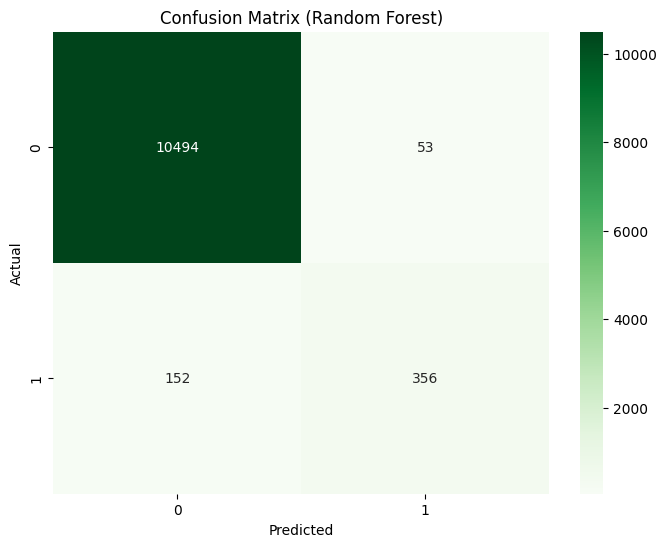


Classification Report on Test Set (Random Forest):
               precision    recall  f1-score   support

           0       0.99      0.99      0.99     10547
           1       0.87      0.70      0.78       508

    accuracy                           0.98     11055
   macro avg       0.93      0.85      0.88     11055
weighted avg       0.98      0.98      0.98     11055



In [ ]:


# Vectorize the text
vectorizer = TfidfVectorizer(max_features=1000, stop_words='english')
X_vectorized = vectorizer.fit_transform(df['headline'])
y = df['category']

X_train, X_test, y_train, y_test = train_test_split(X_vectorized, y, test_size=0.2, random_state=42)

clf = RandomForestClassifier(n_estimators=100, random_state=42)

#K-Fold cross-validation on training data
k = 5
cv_scores = cross_val_score(clf, X_train, y_train, cv=k, scoring='accuracy')

print(f"\nRandom Forest - Cross-validation scores per fold (k={k}): {cv_scores}")
print("Average cross-validation accuracy:", np.mean(cv_scores))

#Train on full training set and evaluate on test set
clf.fit(X_train, y_train)
y_pred = clf.predict(X_test)

# classification report
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Greens', xticklabels=clf.classes_, yticklabels=clf.classes_)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix (Random Forest)')
plt.show()

print("\nClassification Report on Test Set (Random Forest):\n", classification_report(y_test, y_pred))



Random Forest (with UMAP + SMOTE) - Cross-validation scores per fold (k=5): [0.98579125 0.98934344 0.98946122 0.98845471 0.98679692]
Average cross-validation accuracy: 0.9879695069900876


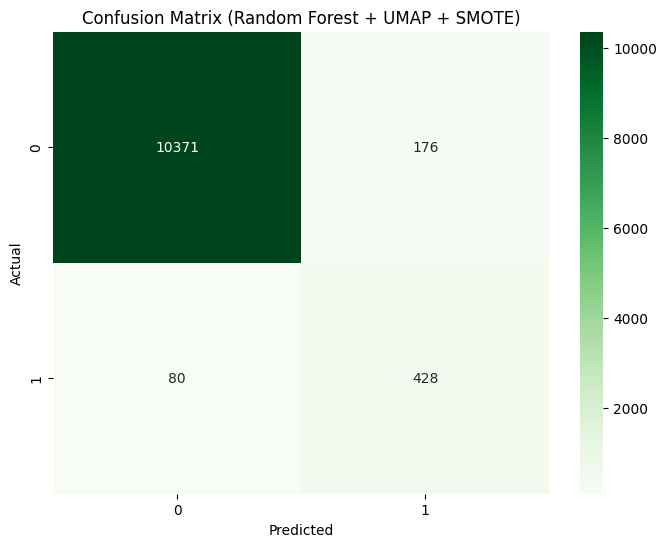


Classification Report on Test Set (Random Forest + SMOTE):
               precision    recall  f1-score   support

           0       0.99      0.98      0.99     10547
           1       0.71      0.84      0.77       508

    accuracy                           0.98     11055
   macro avg       0.85      0.91      0.88     11055
weighted avg       0.98      0.98      0.98     11055



In [ ]:
 # Using UMAP for dimensionality reduction

# Vectorize the text
vectorizer = TfidfVectorizer(max_features=1000, stop_words='english')
X_vectorized = vectorizer.fit_transform(df['headline'])
y = df['category']

X_train, X_test, y_train, y_test = train_test_split(X_vectorized, y, test_size=0.2, random_state=42)

#Apply SMOTE to the training set to handle class imbalance
smote = SMOTE(random_state=42)
X_train_balanced, y_train_balanced = smote.fit_resample(X_train, y_train)

#Initialize Random Forest classifier
clf = RandomForestClassifier(n_estimators=100, random_state=42)

#K-Fold cross-validation on the balanced training data
k = 5
cv_scores = cross_val_score(clf, X_train_balanced, y_train_balanced, cv=k, scoring='accuracy')

print(f"\nRandom Forest (with UMAP + SMOTE) - Cross-validation scores per fold (k={k}): {cv_scores}")
print("Average cross-validation accuracy:", np.mean(cv_scores))

# Step 7: Train on the full balanced training set and evaluate on the test set
clf.fit(X_train_balanced, y_train_balanced)
y_pred = clf.predict(X_test)

# Step 8: Confusion matrix and classification report
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Greens', xticklabels=clf.classes_, yticklabels=clf.classes_)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix (Random Forest + UMAP + SMOTE)')
plt.show()

print("\nClassification Report on Test Set (Random Forest + SMOTE):\n", classification_report(y_test, y_pred))


In [ ]:
testing_df = pd.read_csv('final_topic_output_testing.csv')



In [ ]:


# Load SpaCy for both NER and lemmatization
nlp = spacy.load("en_core_web_sm")

# --- Lemmatization-based Threat Detection ---
def weak_label_threat(text):
    doc = nlp(text.lower())
    lemmas = [token.lemma_ for token in doc]

    threat_keywords = ['outbreak', 'case', 'spread', 'death', 'die', 'emergency', 'confirm', 'toll']
    non_threat_keywords = ['end', 'over', 'slow', 'no']

    if any(word in lemmas for word in threat_keywords):
        if any(word in lemmas for word in non_threat_keywords):
            return 0  # Not a current threat
        return 1  # Active threat
    return 0

# --- Location extraction (only GPEs: countries, cities, etc.) ---
def extract_location(text):
    doc = nlp(text)
    return [ent.text for ent in doc.ents if ent.label_ == "GPE"]
# testing_df = your new tweet DataFrame
X_test_new = vectorizer.transform(testing_df['headline'])

# Predict category and probability
testing_df['predicted_category'] = clf.predict(X_test_new)
testing_df['category_confidence'] = clf.predict_proba(X_test_new)[:, 1]

# Threat filter (only for predicted category = 1)
testing_df['threat_label'] = testing_df['headline'].apply(lambda x: weak_label_threat(x) if x else 0)

# Region extraction
testing_df['regions'] = testing_df['headline'].apply(extract_location)

# Alert severity based on confidence
def alert_severity(conf):
    if conf >= 0.9:
        return "Critical"
    elif conf >= 0.75:
        return "High"
    elif conf >= 0.5:
        return "Medium"
    else:
        return "Low"

testing_df['alert_level'] = testing_df['category_confidence'].apply(alert_severity)

# Filter final alerts
final_alerts_df = testing_df[
    (testing_df['predicted_category'] == 1) &
    (testing_df['threat_label'] == 1)
]

# --- Display Final Alerts ---
print("\n🔔 FINAL ALERTS WITH CONFIDENCE AND REGIONS:\n")
for _, row in final_alerts_df.iterrows():
    print(f"ALERT: {row['headline']}")
    print(f"Confidence: {round(row['category_confidence'] * 100, 1)}%")
    print(f"Severity Level: {row['alert_level']}")
    print(f"Region(s): {', '.join(row['regions']) if row['regions'] else 'Unknown'}")
    print("-" * 20)

# --- Save to CSV ---
final_alerts_df.to_csv("final_alerts_with_confidence_and_regions.csv", index=False)


🔔 FINAL ALERTS WITH CONFIDENCE AND REGIONS:

ALERT: RT @gauthiervillars: #Ebola 911 Eight months into outbreak, #MSF fields calls: Can you build my clinic Train my doctors &gt;
Confidence: 70.0%
Severity Level: Medium
Region(s): Unknown
--------------------
ALERT: RT @TomBurtonWSJ: Mudpacks on #Ebola Patients: How Village Healers Spread the Virus. @WSJ
Confidence: 78.0%
Severity Level: High
Region(s): Unknown
--------------------
ALERT: RT @stefaniei: ICYMI: New York Doctor Seen Unlikely to Have Spread Ebola. Viral load low in early stages. via @WSJ
Confidence: 88.2%
Severity Level: High
Region(s): New York, @WSJ
--------------------
ALERT: CDC Responds Rapidly to Latest Ebola Case
Confidence: 83.8%
Severity Level: High
Region(s): Unknown
--------------------
ALERT: RT @WSJThinkTank: 73% of Americans confident in CDC ability to contain an Ebola outbreak, says @DrewAltman: (AP) htt
Confidence: 60.0%
Severity Level: Medium
Region(s): Unknown
--------------------
ALERT: RT @stefaniei: Th

In [ ]:

def weak_label_threat(text):
    doc = nlp(text.lower())
    lemmas = [token.lemma_ for token in doc]

    if any(word in lemmas for word in ['outbreak', 'case', 'spread', 'death', 'die', 'emergency', 'confirm', 'toll']):
        if any(word in lemmas for word in ['end', 'over', 'slow', 'no']):
            return 0
        return 1
    return 0


In [ ]:
testing_df['predicted_category'] = clf.predict(X_test)

In [ ]:
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix, ConfusionMatrixDisplay

# Print classification report (precision, recall, F1-score)
print(classification_report(y_test, y_pred))

# Accuracy
print("Accuracy:", accuracy_score(y_test, y_pred))


In [ ]:

# Vectorize testing headlines
X_test_new = vectorizer.transform(testing_df['headline'])

# Predict alert category (0 or 1)
testing_df['predicted_category'] = clf.predict(X_test_new)

#Extract Regions Using SpaCy NER

def extract_location(text):
    doc = nlp(text)
    return [ent.text for ent in doc.ents if ent.label_ == "GPE"]

# Apply region extraction
testing_df['regions'] = testing_df['headline'].apply(extract_location)


# Filter for predicted alerts
alert_df = testing_df[testing_df['predicted_category'] == 1]

# Display or export
print("Predicted Alerts with Regions:")
print(alert_df[['headline', 'channel', 'regions']].head(10))

# Optionally save to CSV
alert_df.to_csv("predicted_alerts_with_regions.csv", index=False)

🔔 Predicted Alerts with Regions:
                                              headline channel     regions
31   Costco recalls Kirkland roasted chicken salad ...     cbc  [Kirkland]
79   Guinea tests Canadian developed Ebola vaccine ...     cbc    [Guinea]
96   Slow global reponse to Ebola outbreak caused t...     cbc          []
108  Ebola outbreak: Sierra Leone to lock down hots...     cbc          []
111  Toronto hospital investigating possible Ebola ...     cbc   [Toronto]
113  Organic food products recalled due to salmonel...     cbc          []
115  Guinea sees major setback as new Ebola cases s...     cbc    [Guinea]
125  U.S. aid workers hospitalized after possible E...     cbc      [U.S.]
132  Ebola: American who contracted virus arrives a...     cbc      [U.S.]
147  More funding from Canada needed for next phase...     cbc    [Canada]


In [ ]:
# Vectorize new headlines (e.g., from CBC, Reuters)
X_test_new = vectorizer.transform(testing_df['headline'])

# Predict high-alert category (0 or 1)
testing_df['predicted_category'] = clf.predict(X_test_new)

# Extract Real-World Regions using SpaCy's GPE Entities ---

def extract_location(text):
    doc = nlp(text)
    return [ent.text for ent in doc.ents if ent.label_ == "GPE"]  # GPE = Country, City, State

# Apply extraction to each headline
testing_df['regions'] = testing_df['headline'].apply(extract_location)

# Filter and View Predicted Alerts with Regions

# Filter for only predicted alerts
alert_df = testing_df[testing_df['predicted_category'] == 1]

# Show top results
print("🔔 Predicted Alerts with Regions:")
print(alert_df[['headline', 'channel', 'regions']].head(10))

# Optionally save to file
alert_df.to_csv("predicted_alerts_with_regions.csv", index=False)

🔔 Predicted Alerts with Regions:
                                              headline channel     regions
31   Costco recalls Kirkland roasted chicken salad ...     cbc  [Kirkland]
79   Guinea tests Canadian developed Ebola vaccine ...     cbc    [Guinea]
96   Slow global reponse to Ebola outbreak caused t...     cbc          []
108  Ebola outbreak: Sierra Leone to lock down hots...     cbc          []
111  Toronto hospital investigating possible Ebola ...     cbc   [Toronto]
113  Organic food products recalled due to salmonel...     cbc          []
115  Guinea sees major setback as new Ebola cases s...     cbc    [Guinea]
125  U.S. aid workers hospitalized after possible E...     cbc      [U.S.]
132  Ebola: American who contracted virus arrives a...     cbc      [U.S.]
147  More funding from Canada needed for next phase...     cbc    [Canada]
